# ***Resumen del Proyecto***

***Este proyecto busca utilizar modelos de predicción con el objetivo de obtener un determinado valor que relaciona diferentes tipos de datos climatológicos y definen si en una determinada fecha los valores de la capa de ozono (O3) se consideraban "Normales" o "Altos".***

***Se usarán dos datasets separados y se evaluarán utilizando diferentes modelos predictivos (Redes-Neuronales & Árboles de Decisión), puesto que son buenos modelos para resolver problemas de clasificación como al que nos enfrentamos con este conjunto de datos.***

## ***Fuente de Datos***

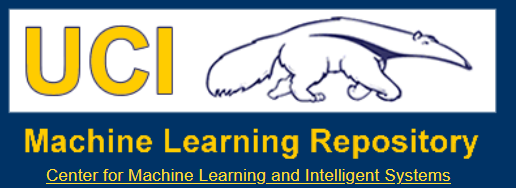

*Nuestra fuente para obtener los datos pertenece al repositorio de Machine Learning de la Universidad de California en Irving - UCI ML*

***URL - Ozone Level Detection:*** https://archive.ics.uci.edu/ml/datasets/ozone+level+detection

A su vez, las fuentes que han recopilado estos datos vienen de la mano de:


*   ***`Kun Zhang, Department of Computer Science, Xavier University of Lousiana`***
*   ***`Wei Fan, IBM T.J.Watson Research`***
*   ***`XiaoJing Yuan, Engineering Technology Department, College of Technology, University of Houston`*** 



## ***Información sobre los datos***

*Dos conjuntos de datos son los que extraeremos desde la fuente. Ambos reflejan dos niveles de la capa de Ozono para diversas fechas. Uno contiene datos para el pico cada 8 horas. El otro para el pico cada 1 hora.*

*Los datos fueron recogidos entre 1998 y 2004 en las áreas de Houston, Galveston y Brazoria en el estado de Texas en EEUU.*

### ***Terminología del Dataset***

*Para entender que significan las diferentes variables del dataset, nos referiremos a su forma de acotar sus términos:*

* #### ***T*** - Temperatura
* #### ***WS*** - Velocidad del Viento
* #### ***RH*** - Humedad Relativa
* ####  ***HPA*** - Hectopascales a cierta altura
        El hectopascal (hPa): Es una unidad de presión que equivale a 100 pascales. Es usado por su equivalencia con el milibar, medida común para expresar la presión atmosférica.

* ####  ***U*** (east-west) - Hace referencia al viento del Este al Oeste
* ####  ***V*** (north-south) - Hace referencia al viento del Norte al Sur
* ####  ***HT*** - Altitud Geopotencial
        Altitud Geo Potencial: Es la altura, referida al nivel del mar, de un punto en la atmósfera, expresada en unidades proporcionales al geopotencial en dicho punto, es decir, al trabajo necesario para llevar una masa unidad desde el nivel del mar hasta ese punto.

* ####  ***SLP*** - Niveles de Presión del Mar
* ####  ***SLP_*** - Cambio de valor en el nivel de presión del mar del día anterior
* ####  ***PREP*** - Precipitaciones
* ####  ***KI (K-Index)*** - Índice Geomagnético K
        El índice geomagnético K cuantifica las alteraciones en la componente horizontal del campo magnético terrestre mediante un número entero en el rango de 0 a 9.
* ####  ***TT (Total Totals)*** - Índice utilizado para evaluar la fuerza de las tormentas.
       El TT es una combinación de los totales verticales (VT) y los totales cruzados (CT). El VT es la diferencia de temperatura entre 850 y 500 mb, mientras que el CT es un punto de rocío de 850 mb menos la temperatura de 500 mb.

### ***Características del Dataset***

*Estas terminologías se utilizan a su vez en conjunto con otras indicaciones numéricas para darles valor y así obtener estas características.*

---
* ####  ***WS0~23*** - Velocidad del Viento para cada hora (0h a 23h)
* ####  ***WS_AV*** - Velocidad del Viento Media
* ####  ***WS_PK*** - Velocidad del Viento Máxima
----
* ####  ***T0~23*** - Temperatura para cada hora (0h a 23h)
* ####  ***T_AV*** - Temperatura Media
* ####  ***T_PK*** - Temperatura Máxima
----
* ####  ***T85, T70, T50*** - Temperatura a 85, 70 y 50 Hectopascales
* ####  ***RH85, RH70, RH50*** - Humedad Relativa a 85, 70 y 50 Hectopascales
* ####  ***U85, U70, U50*** - Viento(Este-Oeste) a 85, 70 y 50 Hectopascales
* ####  ***V85, V70, V50*** - Viento(Norte-Sur) a 85, 70 y 50 Hectopascales
* ####  ***HT85, HT70, HT50*** - Altura Geopotencial a 85, 70 y 50 Hectopascales

# ***Importaciones Previas***

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from scipy import cluster	
import sklearn.neighbors

# Manipulación de datos
from sklearn.preprocessing import StandardScaler  
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

# Técnicas de sintetización de datos
from imblearn.over_sampling import SMOTE

# Separación de datos y clasificación estadística
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score   
from sklearn.metrics import confusion_matrix, roc_curve, auc

# Entrenamiendo del modelo RandomForest
import lazypredict
from lazypredict.Supervised import LazyClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit

# Entrenamiento del modelo Keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

# Importación de modelos y archivos
import sklearn.externals 
import joblib
from google.colab import files

# ***Carga de los Datos***

Los datos los tomaremos del repositorio en Git-Hub que usaremos para guardar el progreso del trabajo.

Git: ***texto en negrita*** https://github.com/Marc-Haze/Data-Analysis/tree/main/Ozone_Level_Detection

In [ ]:
# Fuente para obtener los conjuntos de datos
url_8h_data = 'https://raw.githubusercontent.com/Marc-Haze/Data-Analysis/main/Ozone_Level_Detection/data/eighthr.data'
url_1h_data = 'https://raw.githubusercontent.com/Marc-Haze/Data-Analysis/main/Ozone_Level_Detection/data/onehr.data'

# Las columnas no están especificadas en los .data así que las añadiremos a mano
columns = ["Date","WSR0","WSR1","WSR2","WSR3","WSR4","WSR5","WSR6","WSR7","WSR8",
            "WSR9","WSR10","WSR11","WSR12","WSR13","WSR14","WSR15","WSR16","WSR17",
            "WSR18","WSR19","WSR20","WSR21","WSR22","WSR23","WSR_PK","WSR_AV","T0",
            "T1","T2","T3","T4","T5","T6","T7","T8","T9","T10","T11","T12","T13",
            "T14","T15","T16","T17","T18","T19","T20","T21","T22","T23","T_PK","T_AV",
            "T85","RH85","U85","V85","HT85","T70","RH70","U70","V70","HT70","T50","RH50",
            "U50","V50","HT50","KI","TT","SLP","SLP_","Precp","Target"]

# Leemos los datos con Pandas
data_8h = pd.read_csv(url_8h_data)
data_1h = pd.read_csv(url_1h_data)

# Añadimos las columnas
data_8h.columns = columns
data_1h.columns = columns

## ***Previsualización de Datos para 8H***

In [ ]:
data_8h.head().style.background_gradient()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,WSR9,WSR10,WSR11,WSR12,WSR13,WSR14,WSR15,WSR16,WSR17,WSR18,WSR19,WSR20,WSR21,WSR22,WSR23,WSR_PK,WSR_AV,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19,T20,T21,T22,T23,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,RH70,U70,V70,HT70,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,3.4,4.2,4.5,4.5,4.3,5.5,5.1,3.8,3,2.6,3,2.2,2.3,2.5,2.8,5.5,3.4,15.1,15.3,15.6,15.6,15.9,16.2,16.2,16.2,16.6,17.8,19.4,20.6,21.2,21.8,22.4,22.1,20.8,19.1,18.1,17.2,16.5,16.1,16,16.2,22.4,17.8,9,0.25,-0.41,9.53,1594.5,-2.2,0.96,8.24,7.3,3172,-14.5,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0.000000
1,1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,2.5,3.1,4,4.4,4.6,5.6,5.4,5.2,4.4,3.5,2.7,2.9,3.9,4.1,4.6,5.6,3.5,16.6,16.7,16.7,16.8,16.8,16.8,16.9,16.9,17.1,17.6,19.1,21.3,21.8,22,22.1,22.2,21.3,19.8,18.6,18,18,18.2,18.3,18.4,22.2,18.7,9,0.56,0.89,10.17,1568.5,0.9,0.54,3.8,4.42,3160,-15.9,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0.000000
2,1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,3.1,3.3,3.1,2.3,2.1,2.2,3.8,2.8,2.4,1.9,3.2,4.1,3.9,4.5,4.3,4.7,3.2,18.3,18.2,18.3,18.4,18.6,18.6,18.5,18.7,18.6,18.8,19,19,19.3,19.4,19.6,19.2,18.9,18.8,18.6,18.5,18.3,18.5,18.8,18.9,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,3,0.77,4.17,8.11,3145.5,-16.8,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0.000000
3,1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,1.4,2.2,2,3,3,3.1,3.1,2.7,3,2.4,2.8,2.5,2.5,3.7,3.4,3.7,2.3,18.8,18.6,18.5,18.5,18.6,18.9,19.2,19.4,19.8,20.5,21.1,21.9,23.8,25.1,25.8,26,25.6,24.2,22.9,21.6,20,19.5,19.1,19.1,26,21.1,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.58,0.000000
4,1/6/1998,3.1,3.5,3.3,2.5,1.6,1.7,1.6,1.6,2.3,1.8,2.5,3.9,3.4,2.7,3.4,2.5,2.2,4.4,4.3,3.2,6.2,6.8,5.1,4,6.8,3.2,18.9,19.5,19.6,19.5,19.5,19.5,19.4,19.2,19.1,19.5,19.6,18.6,18.6,18.9,19.2,19.3,19.2,18.8,17.6,16.9,15.6,15.4,15.9,15.8,19.6,18.5,14.4,0.68,1.52,8.62,1499.5,4.3,0.61,9.04,10.81,3111,-11.8,0.09,11.98,11.28,5770,27.95,46.25,10120,?,5.84,0.000000


In [ ]:
data_8h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2533 entries, 0 to 2532
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2533 non-null   object 
 1   WSR0    2533 non-null   object 
 2   WSR1    2533 non-null   object 
 3   WSR2    2533 non-null   object 
 4   WSR3    2533 non-null   object 
 5   WSR4    2533 non-null   object 
 6   WSR5    2533 non-null   object 
 7   WSR6    2533 non-null   object 
 8   WSR7    2533 non-null   object 
 9   WSR8    2533 non-null   object 
 10  WSR9    2533 non-null   object 
 11  WSR10   2533 non-null   object 
 12  WSR11   2533 non-null   object 
 13  WSR12   2533 non-null   object 
 14  WSR13   2533 non-null   object 
 15  WSR14   2533 non-null   object 
 16  WSR15   2533 non-null   object 
 17  WSR16   2533 non-null   object 
 18  WSR17   2533 non-null   object 
 19  WSR18   2533 non-null   object 
 20  WSR19   2533 non-null   object 
 21  WSR20   2533 non-null   object 
 22  

***Comprobamos los valores únicos para cada columna en busca de anomalías.***

In [ ]:
for columna in data_8h.columns:
  valores_unicos = data_8h[columna].unique()
  print(f'Valores Unicos de {columna}:')
  print(f'{valores_unicos}')
  print("------------------------------")

Valores Unicos de Date:
['1/2/1998' '1/3/1998' '1/4/1998' ... '12/29/2004' '12/30/2004'
 '12/31/2004']
------------------------------
Valores Unicos de WSR0:
['2.8' '2.9' '4.7' '2.6' '3.1' '3.7' '2.2' '1' '0.9' '1.1' '1.3' '4.2' '0'
 '2.1' '2.5' '2.7' '0.3' '3.4' '1.2' '2' '0.2' '0.7' '3.5' '1.4' '0.8'
 '0.1' '3.6' '1.7' '4.4' '4.9' '1.5' '0.4' '4' '1.8' '3.8' '3.2' '6.3'
 '4.8' '5.7' '5.3' '2.3' '5.5' '1.6' '3' '0.5' '0.6' '1.9' '4.1' '3.3'
 '2.4' '5.8' '6.9' '?' '4.3' '5' '5.1' '6.2' '5.9' '4.6' '5.2' '3.9' '7.5'
 '4.5' '6' '5.6' '5.4' '6.1' '6.7' '6.5']
------------------------------
Valores Unicos de WSR1:
['3.2' '2.8' '3.8' '2.1' '3.5' '2.9' '1.5' '0.6' '1.7' '4.2' '1.3' '5.1'
 '0.2' '2.2' '2.3' '2' '1.8' '3.6' '0.7' '0.5' '0.3' '0.4' '0.9' '3.1'
 '3.3' '1' '1.1' '3.7' '3' '0.1' '1.2' '4.6' '2.5' '4.7' '2.7' '1.4' '1.9'
 '6.8' '2.4' '4.1' '5.5' '3.9' '0.8' '4.8' '3.4' '5.2' '2.6' '4' '1.6' '0'
 '5.4' '6.7' '4.4' '?' '4.3' '6.3' '4.5' '6.1' '5.6' '5.9' '5' '6.5' '7.7'
 '5.7' '6.2' 

## ***Previsualización de Datos para 1H***

In [ ]:
data_1h.head().style.background_gradient()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,WSR9,WSR10,WSR11,WSR12,WSR13,WSR14,WSR15,WSR16,WSR17,WSR18,WSR19,WSR20,WSR21,WSR22,WSR23,WSR_PK,WSR_AV,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19,T20,T21,T22,T23,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,RH70,U70,V70,HT70,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,3.4,4.2,4.5,4.5,4.3,5.5,5.1,3.8,3,2.6,3,2.2,2.3,2.5,2.8,5.5,3.4,15.1,15.3,15.6,15.6,15.9,16.2,16.2,16.2,16.6,17.8,19.4,20.6,21.2,21.8,22.4,22.1,20.8,19.1,18.1,17.2,16.5,16.1,16,16.2,22.4,17.8,9,0.25,-0.41,9.53,1594.5,-2.2,0.96,8.24,7.3,3172,-14.5,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0.000000
1,1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,2.5,3.1,4,4.4,4.6,5.6,5.4,5.2,4.4,3.5,2.7,2.9,3.9,4.1,4.6,5.6,3.5,16.6,16.7,16.7,16.8,16.8,16.8,16.9,16.9,17.1,17.6,19.1,21.3,21.8,22,22.1,22.2,21.3,19.8,18.6,18,18,18.2,18.3,18.4,22.2,18.7,9,0.56,0.89,10.17,1568.5,0.9,0.54,3.8,4.42,3160,-15.9,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0.000000
2,1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,3.1,3.3,3.1,2.3,2.1,2.2,3.8,2.8,2.4,1.9,3.2,4.1,3.9,4.5,4.3,4.7,3.2,18.3,18.2,18.3,18.4,18.6,18.6,18.5,18.7,18.6,18.8,19,19,19.3,19.4,19.6,19.2,18.9,18.8,18.6,18.5,18.3,18.5,18.8,18.9,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,3,0.77,4.17,8.11,3145.5,-16.8,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0.000000
3,1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,1.4,2.2,2,3,3,3.1,3.1,2.7,3,2.4,2.8,2.5,2.5,3.7,3.4,3.7,2.3,18.8,18.6,18.5,18.5,18.6,18.9,19.2,19.4,19.8,20.5,21.1,21.9,23.8,25.1,25.8,26,25.6,24.2,22.9,21.6,20,19.5,19.1,19.1,26,21.1,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.58,0.000000
4,1/6/1998,3.1,3.5,3.3,2.5,1.6,1.7,1.6,1.6,2.3,1.8,2.5,3.9,3.4,2.7,3.4,2.5,2.2,4.4,4.3,3.2,6.2,6.8,5.1,4,6.8,3.2,18.9,19.5,19.6,19.5,19.5,19.5,19.4,19.2,19.1,19.5,19.6,18.6,18.6,18.9,19.2,19.3,19.2,18.8,17.6,16.9,15.6,15.4,15.9,15.8,19.6,18.5,14.4,0.68,1.52,8.62,1499.5,4.3,0.61,9.04,10.81,3111,-11.8,0.09,11.98,11.28,5770,27.95,46.25,10120,?,5.84,0.000000


In [ ]:
data_1h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2535 entries, 0 to 2534
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2535 non-null   object 
 1   WSR0    2535 non-null   object 
 2   WSR1    2535 non-null   object 
 3   WSR2    2535 non-null   object 
 4   WSR3    2535 non-null   object 
 5   WSR4    2535 non-null   object 
 6   WSR5    2535 non-null   object 
 7   WSR6    2535 non-null   object 
 8   WSR7    2535 non-null   object 
 9   WSR8    2535 non-null   object 
 10  WSR9    2535 non-null   object 
 11  WSR10   2535 non-null   object 
 12  WSR11   2535 non-null   object 
 13  WSR12   2535 non-null   object 
 14  WSR13   2535 non-null   object 
 15  WSR14   2535 non-null   object 
 16  WSR15   2535 non-null   object 
 17  WSR16   2535 non-null   object 
 18  WSR17   2535 non-null   object 
 19  WSR18   2535 non-null   object 
 20  WSR19   2535 non-null   object 
 21  WSR20   2535 non-null   object 
 22  

***Comprobamos los valores únicos para cada columna***

In [ ]:
for columna in data_1h.columns:
  valores_unicos = data_1h[columna].unique()
  print(f'Valores Unicos de {columna}:')
  print(f'{valores_unicos}')
  print("------------------------------")

Valores Unicos de Date:
['1/2/1998' '1/3/1998' '1/4/1998' ... '12/29/2004' '12/30/2004'
 '12/31/2004']
------------------------------
Valores Unicos de WSR0:
['2.8' '2.9' '4.7' '2.6' '3.1' '3.7' '2.2' '1' '0.9' '1.1' '1.3' '4.2' '0'
 '2.1' '2.5' '2.7' '0.3' '3.4' '1.2' '2' '0.2' '0.7' '3.5' '1.4' '0.8'
 '0.1' '3.6' '1.7' '4.4' '4.9' '1.5' '0.4' '4' '1.8' '3.8' '3.2' '6.3'
 '4.8' '5.7' '5.3' '2.3' '5.5' '1.6' '3' '0.5' '0.6' '1.9' '4.1' '3.3'
 '2.4' '5.8' '6.9' '?' '4.3' '5' '5.1' '6.2' '5.9' '4.6' '5.2' '3.9' '7.5'
 '4.5' '6' '5.6' '5.4' '6.1' '6.7' '6.5']
------------------------------
Valores Unicos de WSR1:
['3.2' '2.8' '3.8' '2.1' '3.5' '2.9' '1.5' '0.6' '1.7' '4.2' '1.3' '5.1'
 '0.2' '2.2' '2.3' '2' '1.8' '3.6' '0.7' '0.5' '0.3' '0.4' '0.9' '3.1'
 '3.3' '1' '1.1' '3.7' '3' '0.1' '1.2' '4.6' '2.5' '4.7' '2.7' '1.4' '1.9'
 '6.8' '2.4' '4.1' '5.5' '3.9' '0.8' '4.8' '3.4' '5.2' '2.6' '4' '1.6' '0'
 '5.4' '6.7' '4.4' '?' '4.3' '6.3' '4.5' '6.1' '5.6' '5.9' '5' '6.5' '7.7'
 '5.7' '6.2' 

## ***Valoraciones de nuestro Target***

Vamos a agrupar el conjunto de datos en base a los valores del Target.\

In [ ]:
data_8h.groupby('Target').count()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
Target,,,,,,,,,,,,,,,,,,,,,
0.00,2373,2373,2373,2373,2373,2373,2373,2373,2373,2373,...,2373,2373,2373,2373,2373,2373,2373,2373,2373,2373
1.00,160,160,160,160,160,160,160,160,160,160,...,160,160,160,160,160,160,160,160,160,160


In [ ]:
data_1h.groupby('Target').count()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
Target,,,,,,,,,,,,,,,,,,,,,
0.00,2462,2462,2462,2462,2462,2462,2462,2462,2462,2462,...,2462,2462,2462,2462,2462,2462,2462,2462,2462,2462
1.00,73,73,73,73,73,73,73,73,73,73,...,73,73,73,73,73,73,73,73,73,73


Para cada dataset hemos visto lo siguiente:

*   ***Conjunto de 8H***
        Target = 0 -> 2373 Valores
        Target = 1 -> 160 Valores
*   ***Conjunto de 1H***
        Target = 0 -> 2462 Valores
        Target = 1 -> 73 Valores


Esto será importante a la hora de separar nuestro conjunto de datos de train y test.

## ***Consideraciones de las Previsualizaciones***

*   Se utiliza "?" para enmarcar los datos faltantes
*   Salvo por la fecha, solo existen 2 tipos de datos: Float, Int(Target)
*   La fecha es un dato irrelevante en nuestro dataset (Solo se tienen en cuentra los valores climatológicos)
*   Existen muchos valores horarios que podrían ser sustituidos por su media y pico


* Existe un severo problema respecto al número de datos respecto a los valores de nuestro Target, por lo que debemos considerar generar datos sintéticos para evitar que nuestros modelos de predicciones no sean capaces de predecir resultados con tan ínfimos datos.

# ***Transformaciones del Dataset***

Para mejorar la calidad de nuestros datos, realizaremos las siguientes transformaciones:


*    ***Cambiaremos los valores "?" faltantes por NAN***
*    ***Valoraremos los datos faltantes para rellenarlos/eliminarlos***
*    ***Nuestro [Target] será cambiado de Float a Int***
*    ***Cambiaremos el tipo del conjunto de datos a Float y usaremos la media para rellenar los datos faltantes***
*    ***Normalizaremos la distribución del conjunto usando escalamiento de datos***
*    ***Reduciremos el conjunto al quedarnos con la media y pico de las temperaturas y la velocidad del viento***
*    ***Utilizaremos PCA para reducir más aún la dimensionalidad***
*    ***Normalizaremos la distribución del conjunto usando escalamiento de datos***





## ***Transformaciones de Datos del Conjunto de 8H***

###     ***Cambiaremos los valores "?" faltantes por NAN***

In [ ]:
data_8h = data_8h.replace('?', pd.NA)

###   ***Nuestro [Target] será cambiado de Float a Int***

In [ ]:
data_8h.Target = data_8h.Target.astype(int) 
data_8h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2533 entries, 0 to 2532
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2533 non-null   object
 1   WSR0    2234 non-null   object
 2   WSR1    2241 non-null   object
 3   WSR2    2239 non-null   object
 4   WSR3    2241 non-null   object
 5   WSR4    2240 non-null   object
 6   WSR5    2241 non-null   object
 7   WSR6    2242 non-null   object
 8   WSR7    2244 non-null   object
 9   WSR8    2243 non-null   object
 10  WSR9    2246 non-null   object
 11  WSR10   2245 non-null   object
 12  WSR11   2241 non-null   object
 13  WSR12   2246 non-null   object
 14  WSR13   2245 non-null   object
 15  WSR14   2245 non-null   object
 16  WSR15   2247 non-null   object
 17  WSR16   2249 non-null   object
 18  WSR17   2250 non-null   object
 19  WSR18   2247 non-null   object
 20  WSR19   2241 non-null   object
 21  WSR20   2239 non-null   object
 22  WSR21   2240 non-null   

###     ***Valoraremos los datos faltantes para rellenarlos/eliminarlos***

In [ ]:
# Vamos a comprobar cuales son las características que contienen datos faltantes
# y que porcentaje del mismo ocupan.

# 1- Listamos todas las columnas con datos faltantes
missing_list = data_8h.columns[data_8h.isna().any()].tolist() 
missing_count = []      


# 2 - Recorremos la lista y añadimos la suma de las pérdidas al conteo
for i in missing_list:
  missing_count.append(sum(pd.isnull(data_8h[str(i)])))

# Utilizamos un objeto pandas para visualizar mejor estos datos, calculando
# el porcentaje de pérdida respecto al conjunto total de datos.
d = {'Características':missing_list,'Valores_Faltantes':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Pérdida"] = (Missing_DF['Valores_Faltantes']/data_8h.shape[0])*100
Missing_DF

,Características,Valores_Faltantes,%_Pérdida
0,WSR0,299,11.80
1,WSR1,292,11.53
2,WSR2,294,11.61
3,WSR3,292,11.53
4,WSR4,293,11.57
...,...,...,...
67,KI,136,5.37
68,TT,125,4.93
69,SLP,95,3.75
70,SLP_,158,6.24


Como no tenemos demasiado datos en nuestro dataset, lo que haremos será rellenar los datos faltantes utilizando la media de la columna como valor en lugar de eliminarlos, que sería la respuesta más sencilla.

Pero para poder rellenar con la media, primero necesitamos poder calcularla, así qeu deberemos cambiar antes todos los valores numéricos que han sido leídos como Object a Float.

###   ***Cambiaremos el tipo del conjunto de datos a Float y usaremos la media para rellenar los datos faltantes***

In [ ]:
# Cambiamos los valores desde:
# Fila 0 hasta el final, Columnas de la 1 a la 73 (0 es Date y 74 es Target)
data_8h.iloc[0:,1:73] = data_8h.iloc[0:,1:73].astype(dtype='Float64')

# Rellenamos los datos faltantes utilizando la media de cada columna
data_8h = data_8h.fillna(data_8h.mean())

In [ ]:
data_8h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2533 entries, 0 to 2532
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2533 non-null   object 
 1   WSR0    2533 non-null   Float64
 2   WSR1    2533 non-null   Float64
 3   WSR2    2533 non-null   Float64
 4   WSR3    2533 non-null   Float64
 5   WSR4    2533 non-null   Float64
 6   WSR5    2533 non-null   Float64
 7   WSR6    2533 non-null   Float64
 8   WSR7    2533 non-null   Float64
 9   WSR8    2533 non-null   Float64
 10  WSR9    2533 non-null   Float64
 11  WSR10   2533 non-null   Float64
 12  WSR11   2533 non-null   Float64
 13  WSR12   2533 non-null   Float64
 14  WSR13   2533 non-null   Float64
 15  WSR14   2533 non-null   Float64
 16  WSR15   2533 non-null   Float64
 17  WSR16   2533 non-null   Float64
 18  WSR17   2533 non-null   Float64
 19  WSR18   2533 non-null   Float64
 20  WSR19   2533 non-null   Float64
 21  WSR20   2533 non-null   Float64
 22  

In [ ]:
data_8h.head()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/2/1998,2.80,3.20,3.30,2.70,3.30,3.20,2.90,2.80,3.10,...,0.48,8.39,3.84,5805.00,14.05,29.00,10275.00,-55.00,0.00,0
1,1/3/1998,2.90,2.80,2.60,2.10,2.20,2.50,2.50,2.70,2.20,...,0.60,6.94,9.80,5790.00,17.90,41.30,10235.00,-40.00,0.00,0
2,1/4/1998,4.70,3.80,3.70,3.80,2.90,3.10,2.80,2.50,2.40,...,0.49,8.73,10.54,5775.00,31.15,51.70,10195.00,-40.00,2.08,0
3,1/5/1998,2.60,2.10,1.60,1.40,0.90,1.50,1.20,1.40,1.30,...,0.30,9.87,0.83,5818.83,10.52,37.40,10164.13,-0.10,0.58,0
4,1/6/1998,3.10,3.50,3.30,2.50,1.60,1.70,1.60,1.60,2.30,...,0.09,11.98,11.28,5770.00,27.95,46.25,10120.00,-0.10,5.84,0


Comprobamos que no tengamos datos faltantes.

In [ ]:
# 1- Listamos todas las columnas con datos faltantes
missing_list = data_8h.columns[data_8h.isna().any()].tolist() 
missing_count = []      


# 2 - Recorremos la lista y añadimos la suma de las pérdidas al conteo
for i in missing_list:
  missing_count.append(sum(pd.isnull(data_8h[str(i)])))

# Utilizamos un objeto pandas para visualizar mejor estos datos, calculando
# el porcentaje de pérdida respecto al conjunto total de datos.
d = {'Características':missing_list,'Valores_Faltantes':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Pérdida"] = (Missing_DF['Valores_Faltantes']/data_8h.shape[0])*100
Missing_DF

,Características,Valores_Faltantes,%_Pérdida


### ***Matriz de Correlación de Datos para 8H***

<Axes: >

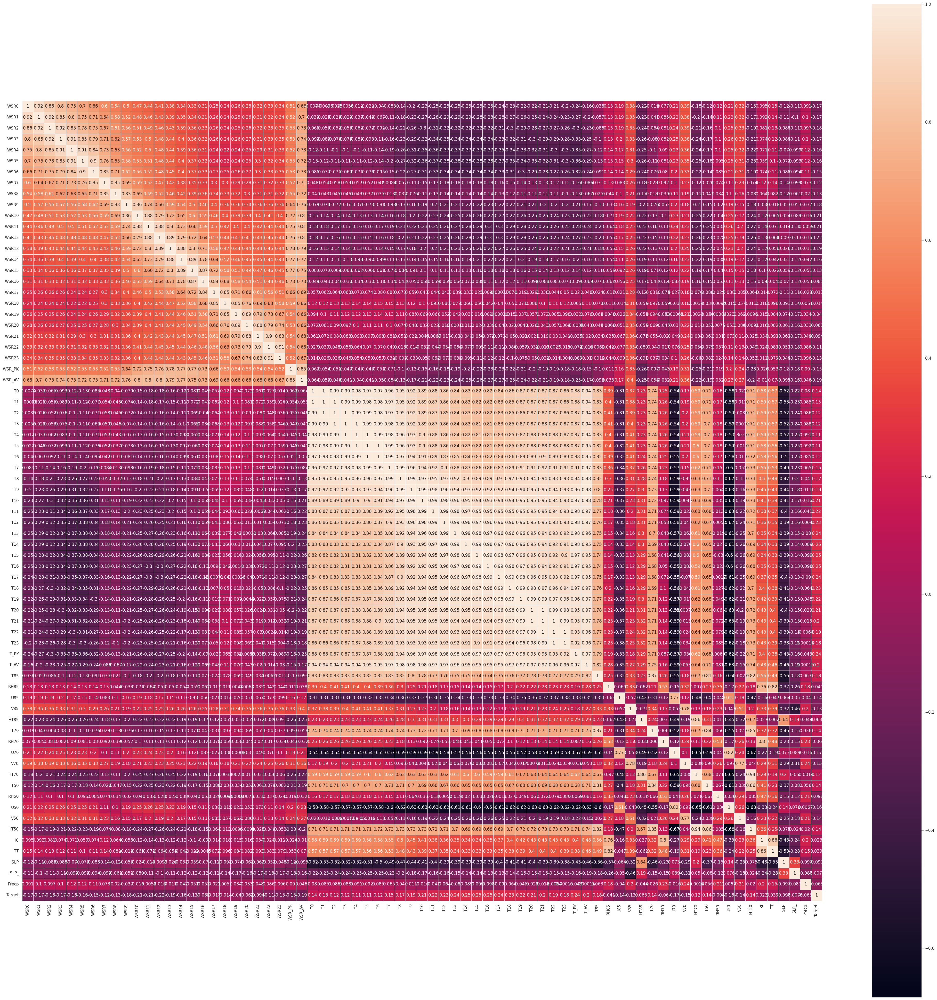

In [ ]:
sns.set()
fig, ax = plt.subplots(figsize=(50,50))  # Manipular el tamaño del Mapa
sns.heatmap(data_8h.corr(), square=True, annot=True, linewidths=.5, ax=ax)

Como nos muestra la matriz de correlación, los valores horarios de la Temperatura y la Velocidad del viento tienen una muy alta correlación entre sí mismos, lo que está sesgando nuestro dataset.

Como ya tenemos la media y el pico de estos conjuntos horarios, haremos una reducción previa para mejorar la calidad de los datos.

### ***Reducción previa de la dimensionalidad***

Antes de comenzar a revisar la normalización y rango de los datos, vamos a reducir su dimensionalidad quitando las columnas de temperaturas y velocidad de viento horarias pero dejando la media y el pico de estas.

También eliminaremos la columna Date, que no nos ofrece realmente ningún valor al conjunto de datos meteorológicos.

In [ ]:
columnas_horarias = ['Date','WSR0','WSR1','WSR2', 'WSR3','WSR4', 'WSR5','WSR6', 'WSR7','WSR8', 'WSR9','WSR10', 'WSR11','WSR12',
                     'WSR13','WSR14', 'WSR15','WSR16', 'WSR17','WSR18', 'WSR19','WSR20', 'WSR21','WSR22', 'WSR23',
                     'T0','T1','T2', 'T3','T4', 'T5','T6', 'T7','T8', 'T9','T10', 'T11','T12', 'T13',
                     'T14', 'T15','T16', 'T17','T18', 'T19','T20', 'T21','T22', 'T23']

data_8h.drop(columnas_horarias, axis=1, inplace=True)

In [ ]:
data_8h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2533 entries, 0 to 2532
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   WSR_PK  2533 non-null   Float64
 1   WSR_AV  2533 non-null   Float64
 2   T_PK    2533 non-null   Float64
 3   T_AV    2533 non-null   Float64
 4   T85     2533 non-null   Float64
 5   RH85    2533 non-null   Float64
 6   U85     2533 non-null   Float64
 7   V85     2533 non-null   Float64
 8   HT85    2533 non-null   Float64
 9   T70     2533 non-null   Float64
 10  RH70    2533 non-null   Float64
 11  U70     2533 non-null   Float64
 12  V70     2533 non-null   Float64
 13  HT70    2533 non-null   Float64
 14  T50     2533 non-null   Float64
 15  RH50    2533 non-null   Float64
 16  U50     2533 non-null   Float64
 17  V50     2533 non-null   Float64
 18  HT50    2533 non-null   Float64
 19  KI      2533 non-null   Float64
 20  TT      2533 non-null   Float64
 21  SLP     2533 non-null   Float64
 22  

### ***Generación de Datos Sintéticos***

Como vimos anteriormente, con respecto a nuestro Target hay una disparar muy grande que va a afectar a nuestros modelos de predicción.

In [ ]:
data_8h.groupby('Target').count()

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
Target,,,,,,,,,,,,,,,,,,,,,
0,2373,2373,2373,2373,2373,2373,2373,2373,2373,2373,...,2373,2373,2373,2373,2373,2373,2373,2373,2373,2373
1,160,160,160,160,160,160,160,160,160,160,...,160,160,160,160,160,160,160,160,160,160


De modo que para intentar solventar este problema utilizaremos una técnica de generación de datos sintéticos para la clase minoritaria llamada SMOTE.

* ***(Synthetic Minority Over-sampling Technique) - SMOTE***

Una técnica de oversampling que se basa en la idea de crear instancias sintéticas para la clase minoritaria (Nuestro Target = 1) a partir de las instancias existentes en los datos.

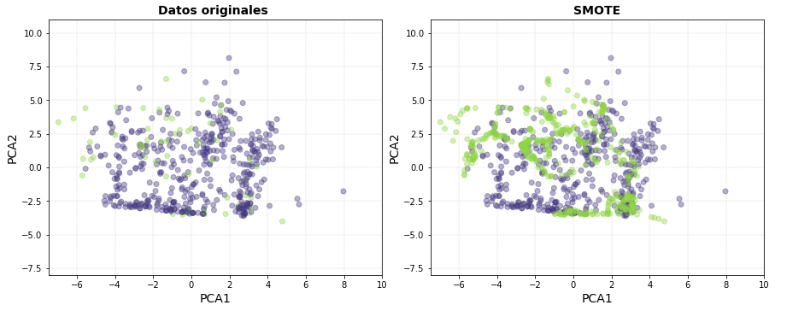

In [ ]:
# Separar las características y las etiquetas
X8h = data_8h.drop(columns=["Target"])  # Reemplaza "Target" con el nombre de la columna de etiquetas
y8h = data_8h["Target"]

# Aplicar SMOTE para generar datos sintéticos
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X8h, y8h)

# Concatenar los datos originales y los datos sintéticos
data_8h = pd.concat([pd.DataFrame(X_resampled, columns=X8h.columns), pd.Series(y_resampled, name="Target")], axis=1)

# Verificar el nuevo balance de clases
class_counts = data_8h["Target"].value_counts()
print(class_counts)

0    2373
1    2373
Name: Target, dtype: int64


Hay que tener en cuenta el problema que supone esta discordancia entre las muestras de cada clase y aumentar tanto 

Ahora que nuestro conjunto de datos tiene sus clases más estabilizadas, vamos a proceder con el escalamiento de datos.

### ***Escalamiento de Datos***

Vamos a revisar la distribución de los datos comprobando sus rangos de valores y así compararla con la distribución tras escalar los datos. 

Primero, separaremos nuestro Target del conjunto de datos previo al escalamiento.

In [ ]:
Y_8h = data_8h['Target']
X_8h = data_8h.drop('Target',axis=1)

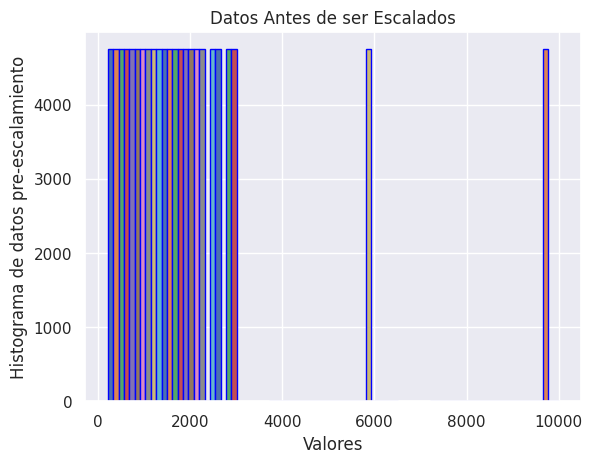

In [ ]:
plt.hist(X_8h, 3, edgecolor='blue')
plt.ylabel('Histograma de datos pre-escalamiento')
plt.xlabel('Valores')
plt.title('Datos Antes de ser Escalados')
plt.show()

<Axes: >

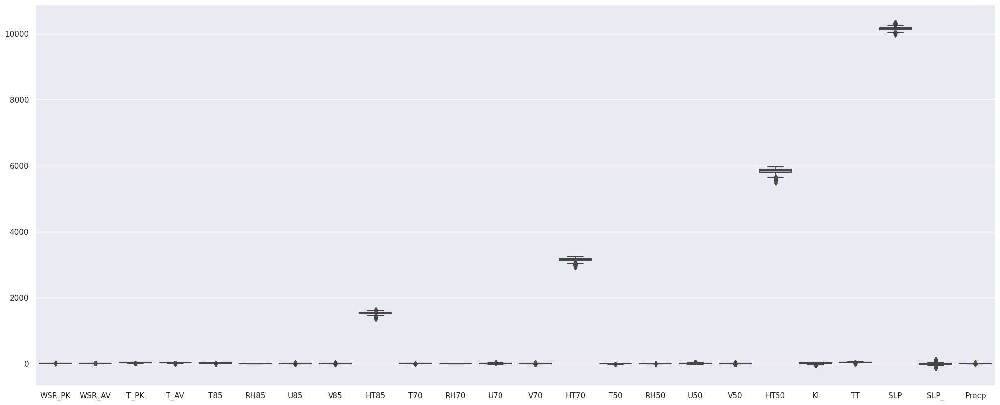

In [ ]:
# Gráfica de cajas para comprobar los rangos de valores
# de las características
plt.figure(figsize=(25,10))
sns.boxplot(data=X_8h)

Como podemos comprobar las características HT85, HT70, HT50 y SLP tienen unos rangos de valores demasiado separados del resto de características.

Así que para evitar que estas características tengan más peso que las demás, vamos a mejorar la distribución de los datos escalándolos.

Tras comprobar algunos escaladores, utilizaremos el escalado por Estandarización-Z

* ***Escalado con Mínimos y Máximos (MinMaxScaler)***

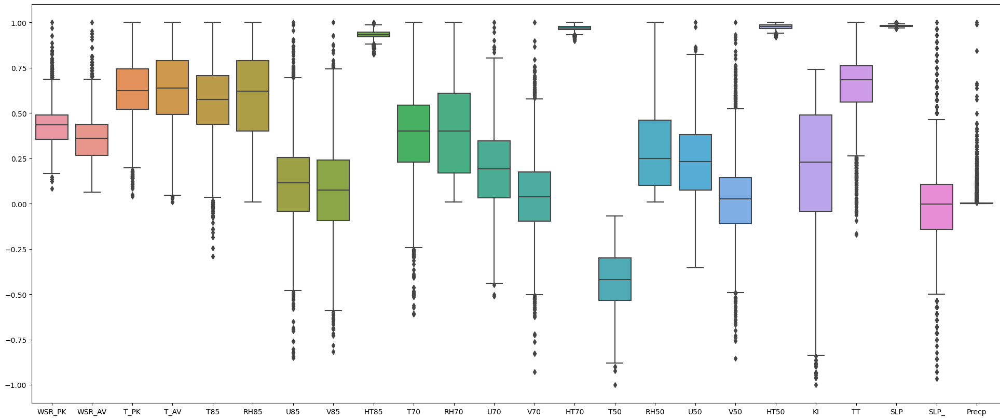

* ***Escalado con Máximos Absolutos (MaxAbsScaler)***

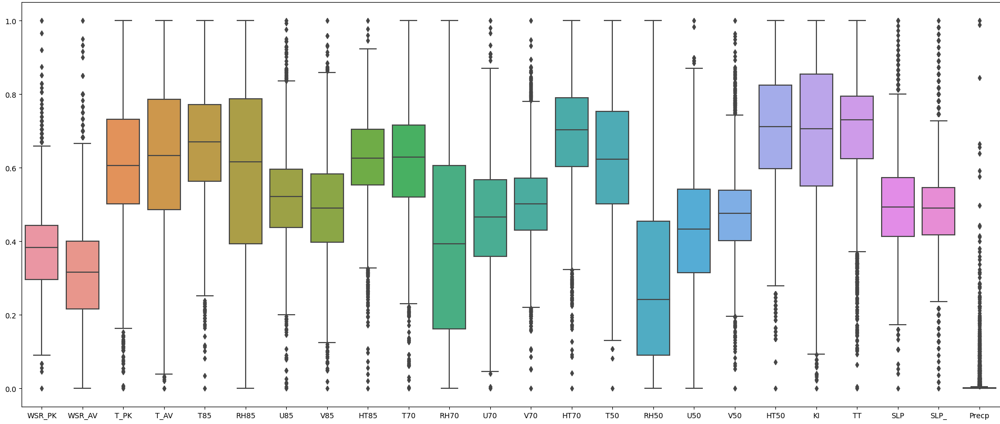

* ***Escalado con Estandarización-Z (StandardScaler)***

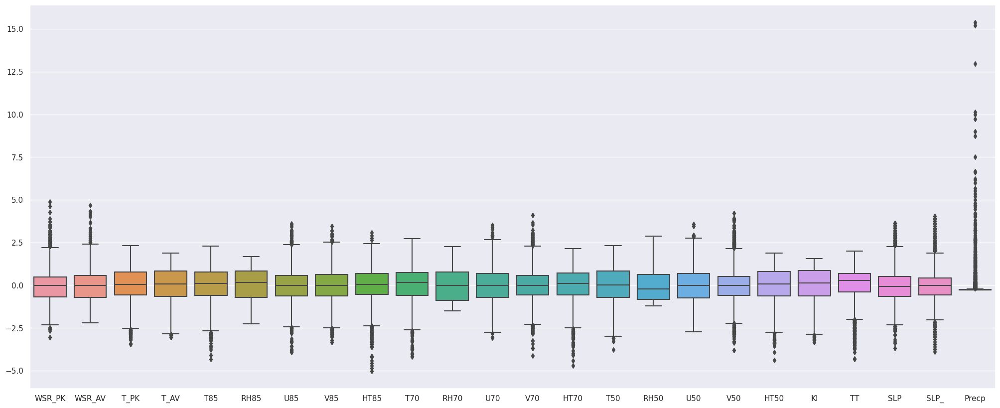

In [ ]:
from sklearn.preprocessing import StandardScaler  

# Creamos el objeto para el proceso de escalamiento
scaler = StandardScaler() 
X_8h_scaled = scaler.fit_transform(X_8h)
X_8h = pd.DataFrame(X_8h_scaled, columns=X_8h.columns)
X_8h.head()

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
0,1.66,1.81,-0.95,-0.89,-1.36,-1.37,-0.33,1.88,1.78,-2.65,...,-1.38,1.03,0.14,0.78,-0.47,0.14,-0.95,2.64,-1.91,-0.23
1,1.76,1.94,-0.98,-0.75,-1.36,0.01,-0.01,2.01,0.99,-1.74,...,-1.77,1.59,-0.02,1.77,-0.68,0.35,0.31,1.75,-1.38,-0.23
2,0.84,1.55,-1.38,-0.75,-1.16,1.47,-0.32,1.68,0.32,-1.13,...,-2.02,1.08,0.18,1.89,-0.89,1.08,1.38,0.87,-1.38,1.88
3,-0.17,0.37,-0.39,-0.35,-0.34,0.08,0.29,0.26,-0.14,-0.27,...,-0.27,0.21,0.30,0.28,-0.28,-0.06,-0.09,0.19,0.02,0.36
4,2.97,1.55,-1.38,-0.78,-0.16,0.54,0.14,1.69,-1.11,-0.75,...,-0.63,-0.80,0.54,2.01,-0.96,0.90,0.82,-0.79,0.02,5.68


<Axes: >

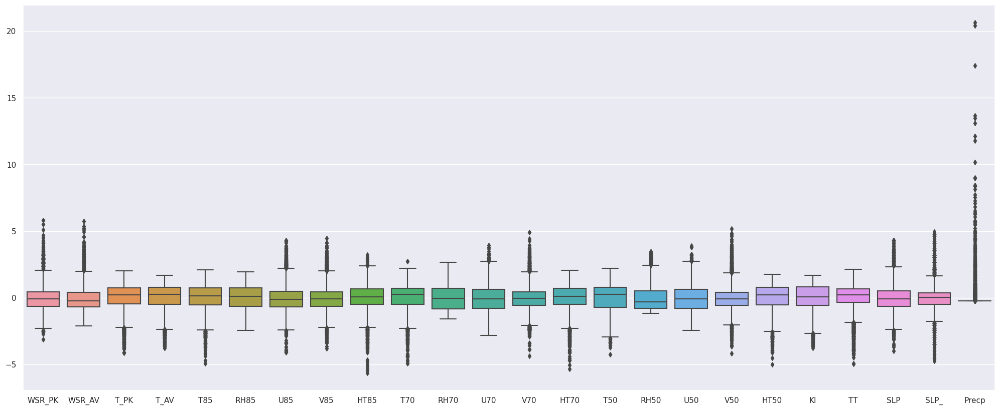

In [ ]:
# Gráfica de cajas para comprobar los rangos de valores
# de las características
plt.figure(figsize=(25,10))
sns.boxplot(data=X_8h)

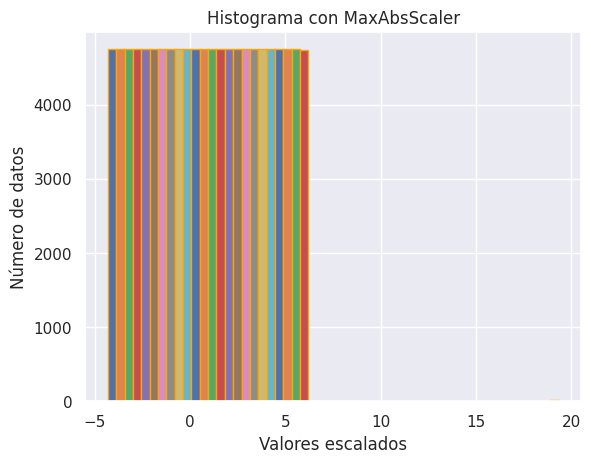

In [ ]:
plt.hist(X_8h, 2, edgecolor='orange')
plt.ylabel('Número de datos')
plt.xlabel('Valores escalados')
plt.title('Histograma con MaxAbsScaler')
plt.show()

### **Segunda Matriz de Correlación de Datos**

<Axes: >

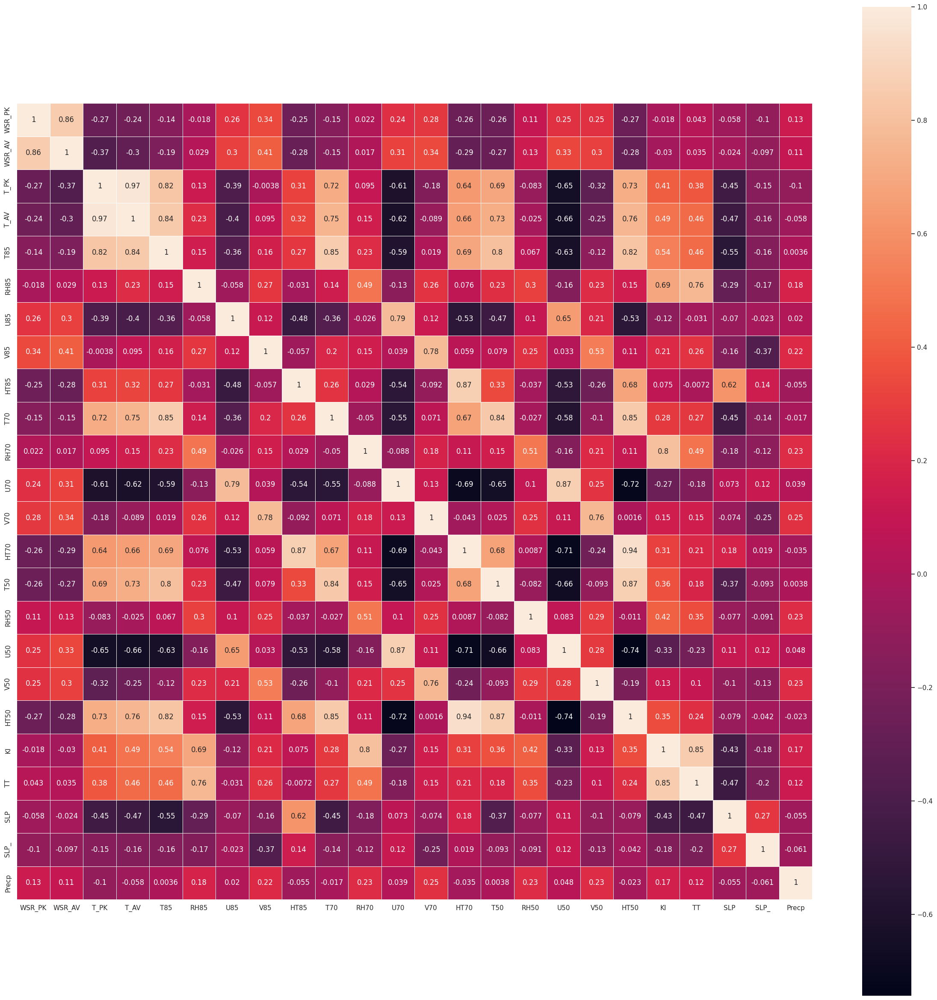

In [ ]:
sns.set()
fig, ax = plt.subplots(figsize=(30,30))  # Manipular el tamaño del Mapa
sns.heatmap(X_8h.corr(), square=True, annot=True, linewidths=.5, ax=ax)

## **Transformaciones de Datos del Conjunto de 1H**

***Realizaremos el mismo tipo de transformaciones que para el conjunto de 8H al ser el mismo tipo de datos con un muestreo diferente.***

###   ***Cambiaremos los valores "?" faltantes por NAN***

In [ ]:
data_1h = data_1h.replace('?', pd.NA)

###   ***Valoraremos los datos faltantes para rellenarlos/eliminarlos***

In [ ]:
# Vamos a comprobar cuales son las características que contienen datos faltantes
# y que porcentaje del mismo ocupan.

# 1- Listamos todas las columnas con datos faltantes
missing_list = data_1h.columns[data_1h.isna().any()].tolist() 
missing_count = []      


# 2 - Recorremos la lista y añadimos la suma de las pérdidas al conteo
for i in missing_list:
  missing_count.append(sum(pd.isnull(data_1h[str(i)])))

# Utilizamos un objeto pandas para visualizar mejor estos datos, calculando
# el porcentaje de pérdida respecto al conjunto total de datos.
d = {'Características':missing_list,'Valores_Faltantes':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Pérdida"] = (Missing_DF['Valores_Faltantes']/data_1h.shape[0])*100
Missing_DF

,Características,Valores_Faltantes,%_Pérdida
0,WSR0,299,11.79
1,WSR1,292,11.52
2,WSR2,294,11.60
3,WSR3,292,11.52
4,WSR4,293,11.56
...,...,...,...
67,KI,136,5.36
68,TT,125,4.93
69,SLP,95,3.75
70,SLP_,159,6.27


Como no tenemos demasiado datos en nuestro dataset, lo que haremos será rellenar los datos faltantes utilizando la media de la columna como valor en lugar de eliminarlos, que sería la respuesta más sencilla.

Pero para poder rellenar con la media, primero necesitamos poder calcularla, así qeu deberemos cambiar antes todos los valores numéricos que han sido leídos como Object a Float.

###   ***Nuestro [Target] será cambiado de Float a Int***

In [ ]:
data_1h.Target = data_1h.Target.astype(int) 
data_1h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2535 entries, 0 to 2534
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2535 non-null   object
 1   WSR0    2236 non-null   object
 2   WSR1    2243 non-null   object
 3   WSR2    2241 non-null   object
 4   WSR3    2243 non-null   object
 5   WSR4    2242 non-null   object
 6   WSR5    2243 non-null   object
 7   WSR6    2244 non-null   object
 8   WSR7    2246 non-null   object
 9   WSR8    2245 non-null   object
 10  WSR9    2248 non-null   object
 11  WSR10   2247 non-null   object
 12  WSR11   2243 non-null   object
 13  WSR12   2248 non-null   object
 14  WSR13   2247 non-null   object
 15  WSR14   2247 non-null   object
 16  WSR15   2249 non-null   object
 17  WSR16   2251 non-null   object
 18  WSR17   2252 non-null   object
 19  WSR18   2249 non-null   object
 20  WSR19   2243 non-null   object
 21  WSR20   2241 non-null   object
 22  WSR21   2242 non-null   

###    ***Cambiaremos el tipo del conjunto de datos a Float y usaremos la media para rellenar los datos faltantes***

In [ ]:
# Cambiamos los valores desde:
# Fila 0 hasta el final, Columnas de la 1 a la 73 (0 es Date y 74 es Target)
data_1h.iloc[0:,1:73] = data_1h.iloc[0:,1:73].astype(dtype='Float64')

# Rellenamos los datos faltantes utilizando la media de cada columna
data_1h = data_1h.fillna(data_1h.mean())

In [ ]:
data_1h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2535 entries, 0 to 2534
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2535 non-null   object 
 1   WSR0    2535 non-null   Float64
 2   WSR1    2535 non-null   Float64
 3   WSR2    2535 non-null   Float64
 4   WSR3    2535 non-null   Float64
 5   WSR4    2535 non-null   Float64
 6   WSR5    2535 non-null   Float64
 7   WSR6    2535 non-null   Float64
 8   WSR7    2535 non-null   Float64
 9   WSR8    2535 non-null   Float64
 10  WSR9    2535 non-null   Float64
 11  WSR10   2535 non-null   Float64
 12  WSR11   2535 non-null   Float64
 13  WSR12   2535 non-null   Float64
 14  WSR13   2535 non-null   Float64
 15  WSR14   2535 non-null   Float64
 16  WSR15   2535 non-null   Float64
 17  WSR16   2535 non-null   Float64
 18  WSR17   2535 non-null   Float64
 19  WSR18   2535 non-null   Float64
 20  WSR19   2535 non-null   Float64
 21  WSR20   2535 non-null   Float64
 22  

In [ ]:
data_1h.head()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/2/1998,2.80,3.20,3.30,2.70,3.30,3.20,2.90,2.80,3.10,...,0.48,8.39,3.84,5805.00,14.05,29.00,10275.00,-55.00,0.00,0
1,1/3/1998,2.90,2.80,2.60,2.10,2.20,2.50,2.50,2.70,2.20,...,0.60,6.94,9.80,5790.00,17.90,41.30,10235.00,-40.00,0.00,0
2,1/4/1998,4.70,3.80,3.70,3.80,2.90,3.10,2.80,2.50,2.40,...,0.49,8.73,10.54,5775.00,31.15,51.70,10195.00,-40.00,2.08,0
3,1/5/1998,2.60,2.10,1.60,1.40,0.90,1.50,1.20,1.40,1.30,...,0.30,9.87,0.83,5818.91,10.52,37.40,10164.11,-0.11,0.58,0
4,1/6/1998,3.10,3.50,3.30,2.50,1.60,1.70,1.60,1.60,2.30,...,0.09,11.98,11.28,5770.00,27.95,46.25,10120.00,-0.11,5.84,0


Comprobamos que no tengamos datos faltantes.

In [ ]:
# 1- Listamos todas las columnas con datos faltantes
missing_list = data_1h.columns[data_1h.isna().any()].tolist() 
missing_count = []      


# 2 - Recorremos la lista y añadimos la suma de las pérdidas al conteo
for i in missing_list:
  missing_count.append(sum(pd.isnull(data_1h[str(i)])))

# Utilizamos un objeto pandas para visualizar mejor estos datos, calculando
# el porcentaje de pérdida respecto al conjunto total de datos.
d = {'Características':missing_list,'Valores_Faltantes':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Pérdida"] = (Missing_DF['Valores_Faltantes']/data_1h.shape[0])*100
Missing_DF

,Características,Valores_Faltantes,%_Pérdida


### ***Matriz de Correlación de Datos para 1H***

<Axes: >

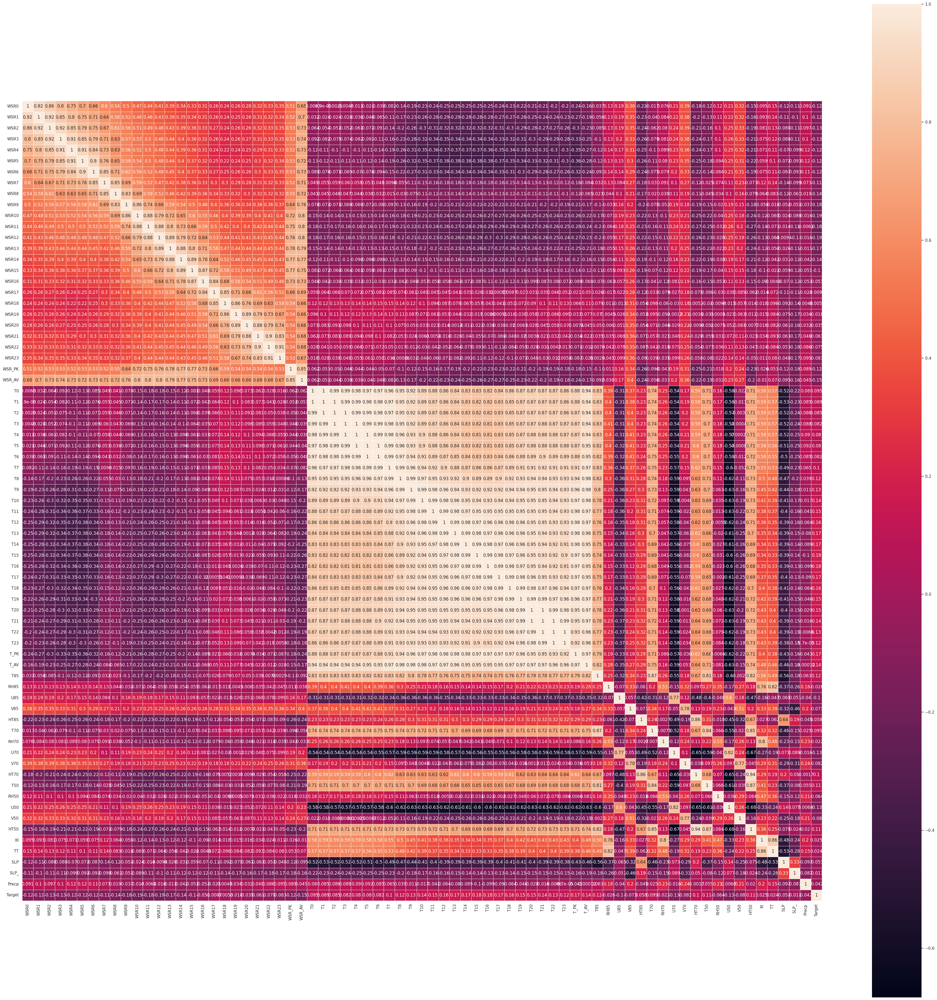

In [ ]:
sns.set()
fig, ax = plt.subplots(figsize=(50,50))  # Manipular el tamaño del Mapa
sns.heatmap(data_1h.corr(), square=True, annot=True, linewidths=.5, ax=ax)

### ***Reducción previa de la dimensionalidad***

Antes de comenzar a revisar la normalización y rango de los datos, vamos a reducir su dimensionalidad quitando las columnas de temperaturas y velocidad de viento horarias pero dejando la media y el pico de estas.

También eliminaremos la columna Date, que no nos ofrece realmente ningún valor al conjunto de datos meteorológicos.

In [ ]:
columnas_horarias = ['Date','WSR0','WSR1','WSR2', 'WSR3','WSR4', 'WSR5','WSR6', 'WSR7','WSR8', 'WSR9','WSR10', 'WSR11','WSR12',
                     'WSR13','WSR14', 'WSR15','WSR16', 'WSR17','WSR18', 'WSR19','WSR20', 'WSR21','WSR22', 'WSR23',
                     'T0','T1','T2', 'T3','T4', 'T5','T6', 'T7','T8', 'T9','T10', 'T11','T12', 'T13',
                     'T14', 'T15','T16', 'T17','T18', 'T19','T20', 'T21','T22', 'T23']

data_1h.drop(columnas_horarias, axis=1, inplace=True)
data_1h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2535 entries, 0 to 2534
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   WSR_PK  2535 non-null   Float64
 1   WSR_AV  2535 non-null   Float64
 2   T_PK    2535 non-null   Float64
 3   T_AV    2535 non-null   Float64
 4   T85     2535 non-null   Float64
 5   RH85    2535 non-null   Float64
 6   U85     2535 non-null   Float64
 7   V85     2535 non-null   Float64
 8   HT85    2535 non-null   Float64
 9   T70     2535 non-null   Float64
 10  RH70    2535 non-null   Float64
 11  U70     2535 non-null   Float64
 12  V70     2535 non-null   Float64
 13  HT70    2535 non-null   Float64
 14  T50     2535 non-null   Float64
 15  RH50    2535 non-null   Float64
 16  U50     2535 non-null   Float64
 17  V50     2535 non-null   Float64
 18  HT50    2535 non-null   Float64
 19  KI      2535 non-null   Float64
 20  TT      2535 non-null   Float64
 21  SLP     2535 non-null   Float64
 22  

* ***Separación del Target del conjunto para el escalado***

In [ ]:
Y_1h = data_1h['Target']
X_1h = data_1h.drop('Target',axis=1)

### ***Generación de Datos Sintéticos***

Como vimos anteriormente, con respecto a nuestro Target hay una disparar muy grande que va a afectar a nuestros modelos de predicción.

In [ ]:
data_1h.groupby('Target').count()

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
Target,,,,,,,,,,,,,,,,,,,,,
0,2462,2462,2462,2462,2462,2462,2462,2462,2462,2462,...,2462,2462,2462,2462,2462,2462,2462,2462,2462,2462
1,73,73,73,73,73,73,73,73,73,73,...,73,73,73,73,73,73,73,73,73,73


De modo que para intentar solventar este problema utilizaremos una técnica de generación de datos llamada SMOTE.

In [ ]:
# Separar las características y las etiquetas
X1h = data_1h.drop(columns=["Target"])  # Reemplaza "Target" con el nombre de la columna de etiquetas
y1h = data_1h["Target"]

# Aplicar SMOTE para generar datos sintéticos
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X1h, y1h)

# Concatenar los datos originales y los datos sintéticos
data_1h = pd.concat([pd.DataFrame(X_resampled, columns=X1h.columns), pd.Series(y_resampled, name="Target")], axis=1)

# Verificar el nuevo balance de clases
class_counts = data_1h["Target"].value_counts()
print(class_counts)

0    2462
1    2462
Name: Target, dtype: int64


Ahora que nuestro conjunto de datos tiene sus clases más estabilizadas, vamos a proceder con el escalamiento de datos.

### **Escalamiento de Datos**

Vamos a revisar la distribución de los datos comprobando sus rangos de valores y así compararla con la distribución tras escalar los datos.

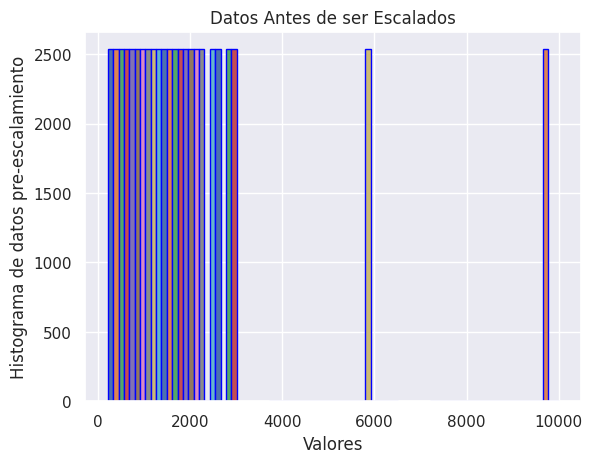

In [ ]:
plt.hist(X_1h, 3, edgecolor='blue')
plt.ylabel('Histograma de datos pre-escalamiento')
plt.xlabel('Valores')
plt.title('Datos Antes de ser Escalados')
plt.show()

<Axes: >

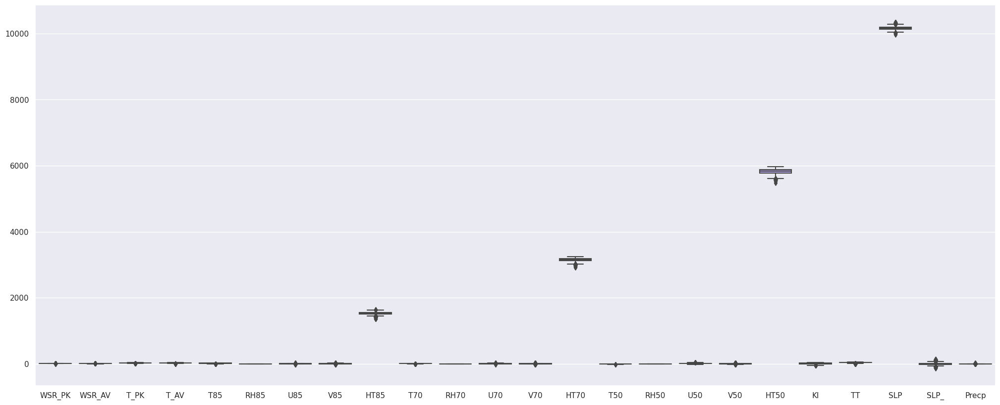

In [ ]:
# Gráfica de cajas para comprobar los rangos de valores
# de las características
plt.figure(figsize=(25,10))
sns.boxplot(data=X_1h)

Como podemos comprobar las características HT85, HT70, HT50 y SLP tienen unos rangos de valores demasiado separados del resto de características.

Así que para evitar que estas características tengan más peso que las demás, vamos a mejorar la distribución de los datos escalándolos.

In [ ]:
# Creamos el objeto para el proceso de escalamiento
scaler = StandardScaler() 
X_1h_scaled = scaler.fit_transform(X_1h)
X_1h = pd.DataFrame(X_1h_scaled, columns=X_1h.columns)
X_1h.head()

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
0,1.20,1.24,-0.46,-0.45,-0.96,-1.30,-0.56,1.33,1.75,-2.15,...,-1.05,0.72,-0.16,0.43,-0.18,0.18,-0.77,2.16,-1.58,-0.28
1,1.29,1.36,-0.49,-0.32,-0.96,-0.07,-0.27,1.44,1.03,-1.33,...,-1.42,1.22,-0.32,1.27,-0.37,0.37,0.36,1.38,-1.15,-0.28
2,0.48,1.01,-0.87,-0.32,-0.77,1.24,-0.54,1.17,0.42,-0.78,...,-1.66,0.76,-0.12,1.38,-0.57,1.02,1.31,0.60,-1.15,1.30
3,-0.43,-0.02,0.06,0.04,0.00,-0.00,0.00,-0.00,-0.00,-0.00,...,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.16
4,2.37,1.01,-0.87,-0.35,0.17,0.41,-0.14,1.18,-0.89,-0.43,...,-0.34,-0.88,0.23,1.48,-0.63,0.87,0.81,-0.86,0.00,4.15


<Axes: >

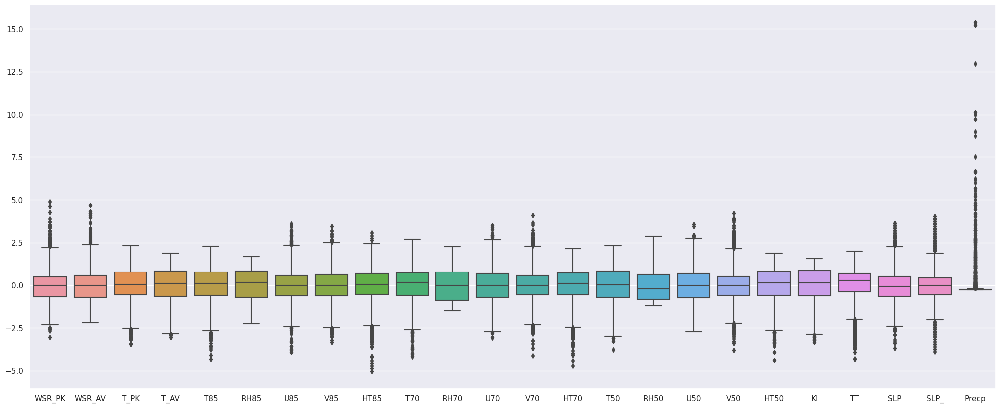

In [ ]:
# Gráfica de cajas para comprobar los rangos de valores
# de las características
plt.figure(figsize=(25,10))
sns.boxplot(data=X_1h)

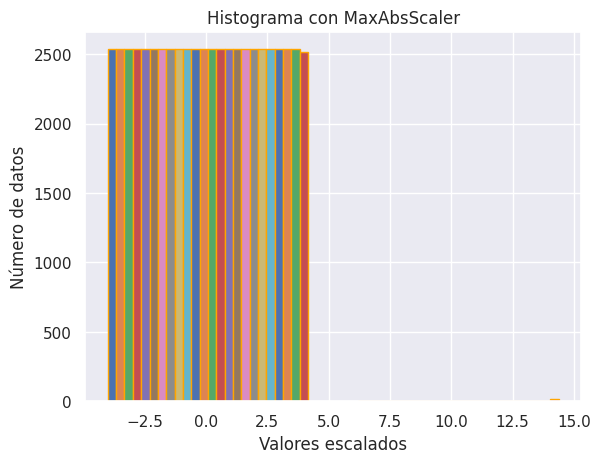

In [ ]:
plt.hist(X_1h, 2, edgecolor='orange')
plt.ylabel('Número de datos')
plt.xlabel('Valores escalados')
plt.title('Histograma con MaxAbsScaler')
plt.show()

### ***Segunda Matriz de Correlación de datos***

<Axes: >

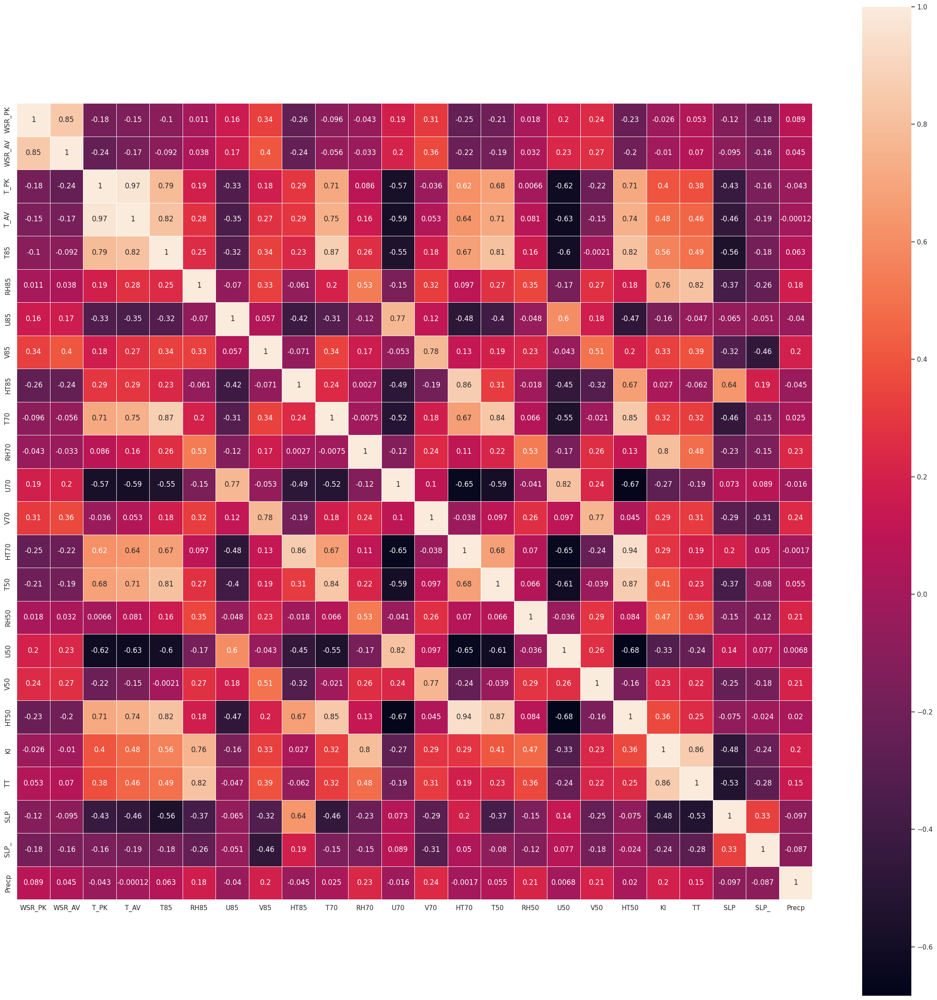

In [ ]:
sns.set()
fig, ax = plt.subplots(figsize=(30,30))  # Manipular el tamaño del Mapa
sns.heatmap(X_1h.corr(), square=True, annot=True, linewidths=.5, ax=ax)

## ***Estudio de las Características y la Dimensionalidad***

Para valorar reducir la dimensionalidad, primero vamos a comprobar las relaciones entre las características.

* ***Dendograma del Dataset para 8h***

Distancia Media	  87.29


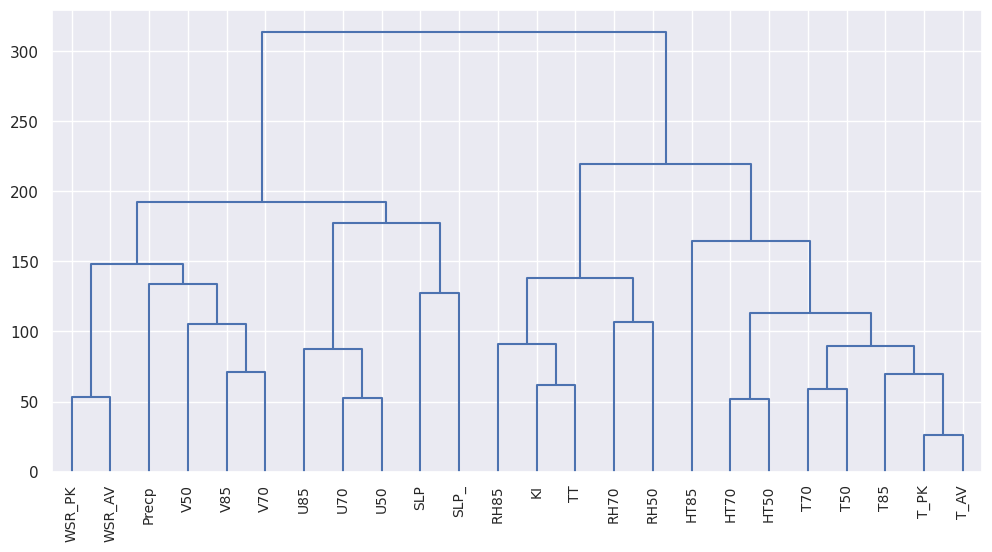

In [ ]:
# Obtenemos la traspuesta de la matriz
X_8h_t = X_8h.T

dist = sklearn.neighbors.DistanceMetric.get_metric('euclidean') 
D = dist.pairwise(X_8h_t)
avD = np.average(D)
print("Distancia Media\t {:6.2f}".format(avD))

# 2. Construimos el dendograma	
plt.figure(figsize=(12, 6))
threshold_2 = 7

# Seleccionamos como distancia intercluster el vecino más alejado (complete)
clusters = cluster.hierarchy.linkage(D, method='complete')
cluster.hierarchy.dendrogram(clusters, color_threshold=threshold_2, labels=X_8h.columns.to_list(), leaf_rotation=90)
plt.show()

* ***Uso de algoritmos PCA para reducir la dimensionalidad***

Vamos a utilizar un algoritmo de componentes principales para reducir más todavía la dimensionalidad del conjunto de datos.

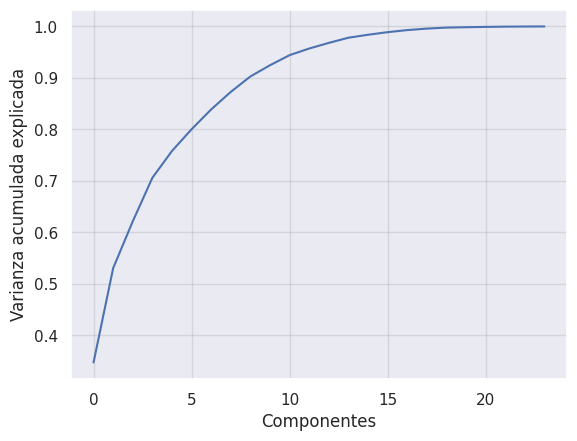

In [ ]:
# Creamos el objeto PCA
pca=PCA().fit(X_8h)

# Crear el gráfico para las varianzas de cada número de componentes
fig, ax = plt.subplots()
ax.plot(np.cumsum(pca.explained_variance_ratio_))
ax.set_xlabel("Componentes")
ax.set_ylabel("Varianza acumulada explicada")

# Añadir una cuadrícula de fondo
ax.grid(True, color='gray', alpha=0.2)

# Mostrar el gráfico
plt.show()

In [ ]:
# --- Transformamos el dataframe en un array ---
X_8h_array = np.asarray(X_8h)

# --- Aplicamos PCA y reducimos los componentes a 2 ---
pca = PCA(n_components=12, random_state=24)
X_8h_pca = pca.fit_transform(X_8h_array)

In [ ]:
# Crear una lista de nombres de columna para el nuevo dataframe
column_names = ["Componente_" + str(i+1) for i in range(12)]

# Convertir la matriz en un dataframe
data8h_pca = pd.DataFrame(data=X_8h_pca, columns=column_names)
data8h_pca.head()

,Componente_1,Componente_2,Componente_3,Componente_4,Componente_5,Componente_6,Componente_7,Componente_8,Componente_9,Componente_10,Componente_11,Componente_12
0,2.77,1.44,3.93,-2.43,1.37,1.34,-1.46,2.11,-1.43,-1.79,-1.18,0.51
1,2.52,2.46,3.14,-1.72,1.31,1.30,-1.44,0.83,-0.72,0.32,-0.89,-0.43
2,2.07,4.23,1.99,-2.51,0.19,1.72,0.09,0.40,0.71,0.11,-0.64,-0.38
3,1.00,0.49,0.27,-0.26,-0.24,-0.10,0.12,0.09,0.12,0.00,0.08,0.15
4,2.64,5.08,1.96,0.19,0.30,0.71,4.42,0.02,2.47,-1.19,-1.08,-0.40


In [ ]:
data8h_pca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4746 entries, 0 to 4745
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Componente_1   4746 non-null   float64
 1   Componente_2   4746 non-null   float64
 2   Componente_3   4746 non-null   float64
 3   Componente_4   4746 non-null   float64
 4   Componente_5   4746 non-null   float64
 5   Componente_6   4746 non-null   float64
 6   Componente_7   4746 non-null   float64
 7   Componente_8   4746 non-null   float64
 8   Componente_9   4746 non-null   float64
 9   Componente_10  4746 non-null   float64
 10  Componente_11  4746 non-null   float64
 11  Componente_12  4746 non-null   float64
dtypes: float64(12)
memory usage: 445.1 KB


* ***Realizamos el mismo procedimiento para los datos de 1H***

In [ ]:
Y_1h = data_1h['Target']
X_1h = data_1h.drop('Target',axis=1)

Distancia Media	 108468.71


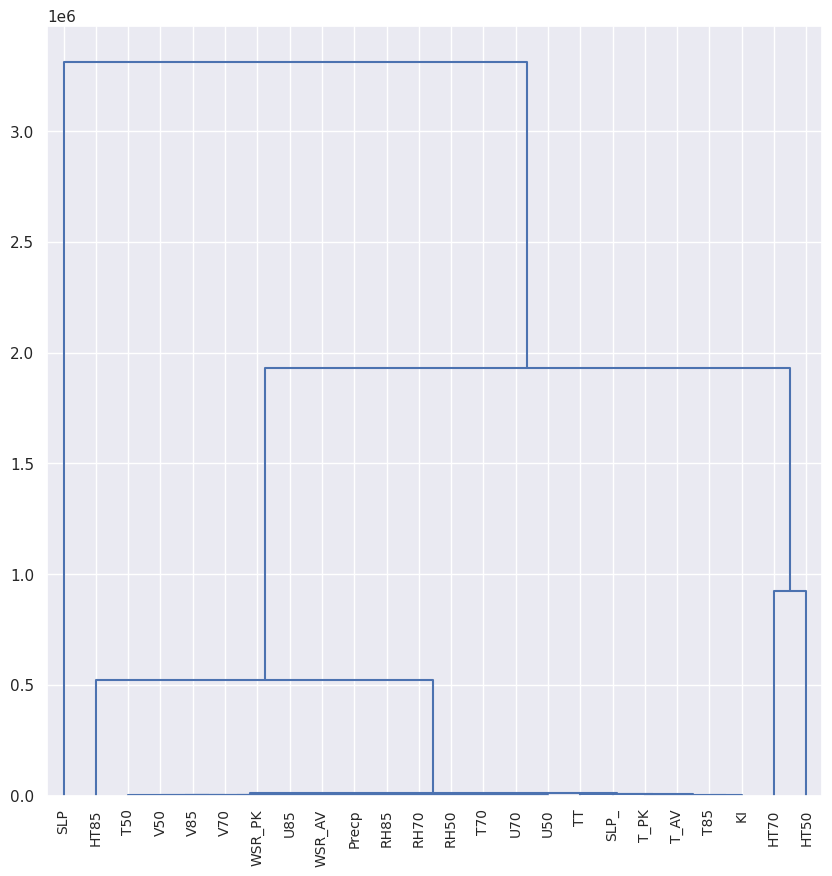

In [ ]:
# Obtenemos la traspuesta de la matriz
X_1h_t = X_1h.T

dist = sklearn.neighbors.DistanceMetric.get_metric('euclidean') 
D = dist.pairwise(X_1h_t)
avD = np.average(D)
print("Distancia Media\t {:6.2f}".format(avD))

# 2. Constuimos el dendograma	
plt.figure(figsize=(10, 10))
threshold_2 = 7

# Seleccionamos como distancia intercluster el vecino más alejado (complete)
clusters = cluster.hierarchy.linkage(D, method='complete')
cluster.hierarchy.dendrogram(clusters, color_threshold=threshold_2, labels=X_1h.columns.to_list(), leaf_rotation=90)
plt.show()

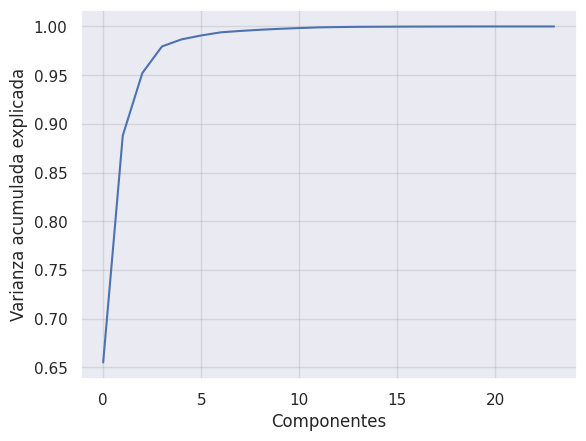

In [ ]:
# Creamos el objeto PCA
pca=PCA().fit(X_1h)

# Crear el gráfico para las varianzas de cada número de componentes
fig, ax = plt.subplots()
ax.plot(np.cumsum(pca.explained_variance_ratio_))
ax.set_xlabel("Componentes")
ax.set_ylabel("Varianza acumulada explicada")

# Añadir una cuadrícula de fondo
ax.grid(True, color='gray', alpha=0.2)

# Mostrar el gráfico
plt.show()

In [ ]:
# --- Transformamos el dataframe en un array ---
X_1h_array = np.asarray(X_1h)

# --- Aplicamos PCA y reducimos los componentes a 2 ---
pca = PCA(n_components=4, random_state=24)
X_1h_pca = pca.fit_transform(X_1h_array)

In [ ]:
# Crear una lista de nombres de columna para el nuevo dataframe
column_names = ["Componente_" + str(i+1) for i in range(4)]

# Convertir la matriz en un dataframe
data1h_pca = pd.DataFrame(data=X_1h_pca, columns=column_names)
data1h_pca.head()

,Componente_1,Componente_2,Componente_3,Componente_4
0,3.47,123.66,-80.51,-20.96
1,30.25,83.21,-57.82,-26.60
2,57.19,40.21,-49.99,-38.68
3,28.96,9.96,-0.60,-1.70
4,96.62,-34.76,6.82,-22.41


In [ ]:
data1h_pca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4924 entries, 0 to 4923
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Componente_1  4924 non-null   float64
 1   Componente_2  4924 non-null   float64
 2   Componente_3  4924 non-null   float64
 3   Componente_4  4924 non-null   float64
dtypes: float64(4)
memory usage: 154.0 KB


# ***Fase de Entrenamiento***

Como tenemos dos conjuntos de datos con un muestreo diferentes, se utilizarán los siguientes modelos para cada conjunto de datos:

* ***Redes Neuronales (Modelo Secuencial de Keras) - Conjunto de datos de 8H***
* ***Árboles de Decisión - Conjunto de datos de 1H***



## ***Entrenamiento del Modelo RNN para el conjunto de datos de 8H***

* #### ***Separación de los Datos de 8H en Entrenamiento y Test***

In [ ]:
X_8h = data8h_pca
# Recordemos que Y_8h = data_8h['Target']
x_train_8h, x_test_8h, y_train_8h, y_test_8h = train_test_split(X_8h,Y_8h,test_size=.2,random_state=74)

* #### ***Entrenamiento del Modelo***

In [ ]:
# Crear el modelo de redes neuronales
tree_model = Sequential()

tree_model.add(Dense(128, activation='relu', input_shape=(x_train_8h.shape[1],)))
tree_model.add(Dropout(0.2))
tree_model.add(Dense(64, activation='relu'))
tree_model.add(Dropout(0.2)) 
tree_model.add(Dense(1, activation='sigmoid'))

# Compilar el modelo
tree_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Imprimir un resumen del modelo
tree_model.summary()

# Entrenar el modelo
history = tree_model.fit(x_train_8h, y_train_8h, batch_size=64, epochs=20, validation_data=(x_test_8h, y_test_8h))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1664      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 9,985
Trainable params: 9,985
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
60/60 [==============================] - 

In [ ]:
y_pred = tree_model.predict(x_test_8h)
y_pred = np.round(y_pred).flatten().astype(int)

print(f"Predicciones: {y_pred}\n")
print(f"Valores Reales: {np.array(y_test_8h)}")

30/30 [==============================] - 0s 1ms/step
Predicciones: [0 1 1 1 0 1 0 1 1 1 0 1 0 0 1 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 0 1 0 1 1 1 0
 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 0 0 1
 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1
 1 1 1 0 1 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 0
 1 1 1 0 0 1 1 1 1 1 0 0 1 1 0 0 1 1 0 1 0 1 1 1 0 0 0 0 1 1 1 1 0 1 1 0 1
 0 1 1 1 0 1 1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 1 1
 0 1 0 1 0 0 1 1 0 1 1 0 1 0 1 1 1 0 1 0 1 1 1 0 0 1 0 0 1 0 1 0 1 0 1 0 1
 0 1 1 0 0 0 1 0 1 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 1 0 1 1 1 0
 0 0 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1
 1 1 0 0 1 0 1 0 1 1 0 1 1 0 1 0 1 1 1 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 0 1 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 0 0
 0 1 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 1 0 1 1
 1 0 1 1 1 1 0 1 0 0 0 0 0 0 1 1 

* #### ***Valoración de los resultados***

In [ ]:
print(classification_report(y_test_8h, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.89      0.93       483
           1       0.89      0.97      0.93       467

    accuracy                           0.93       950
   macro avg       0.93      0.93      0.93       950
weighted avg       0.93      0.93      0.93       950



In [ ]:
def plot_acc(history, title="Model Accuracy"):
  """Imprime una gráfica mostrando la accuracy por epoch obtenida en un entrenamiento"""
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title(title)
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Val'], loc='upper left')
  plt.show()
  
def plot_loss(history, title="Model Loss"):
  """Imprime una gráfica mostrando la pérdida por epoch obtenida en un entrenamiento"""
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title(title)
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

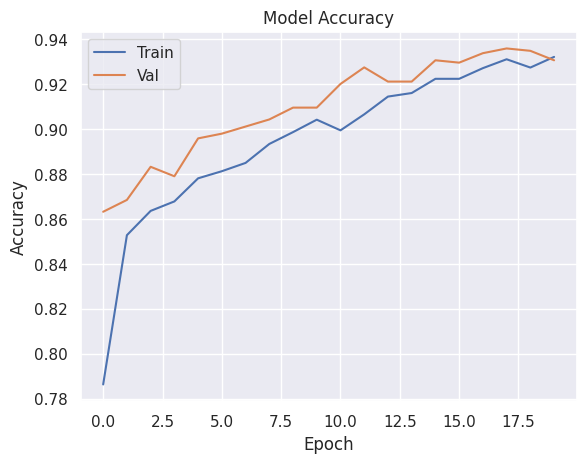

In [ ]:
plot_acc(history)

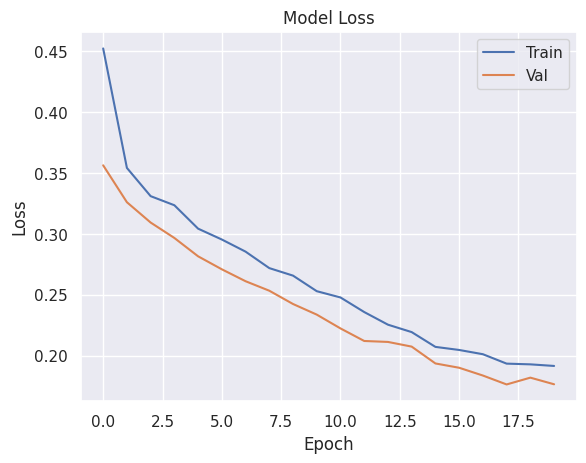

In [ ]:
plot_loss(history)

* #### ***Exportación del modelo***

In [ ]:
#Exportar el modelo en formato h5
tree_model.save('keras_ozone.h5')

!pip install tensorflowjs

#Crear carpeta donde se colocaran los archivos resultantes
!mkdir carpeta_salida

#Realizar la exportacion a la carpeta de salida
!tensorflowjs_converter --input_format keras keras_ozone.h5 carpeta_salida

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘carpeta_salida’: File exists
2023-05-19 16:51:59.650631: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## ***Entrenamiento del Modelo de Árboles para el conjunto de Datos de 1h***

* #### ***Separación de los Datos de 1H en Entrenamiento y Test***

In [ ]:
X_1h = data1h_pca
# Recordemos que Y_1h = data_1h['Target']
x_train_1h, x_test_1h, y_train_1h, y_test_1h = train_test_split(X_1h,Y_1h,test_size=.2,random_state=74)

* #### ***Clasificación de los Modelos de Clasificación con LazyPredict***

Pero primero de todo vamos a hacer una valoración previa de cuales serían los mejores modelos para predecir con nuestro conjunto de datos utilizando la herramienta LazyPredict.

***Url herramienta LazyPredict -*** https://pypi.org/project/lazypredict/

In [ ]:
!pip install lazypredict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(x_train_1h, x_test_1h, y_train_1h, y_test_1h)

models

100%|██████████| 29/29 [00:06<00:00,  4.73it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
ExtraTreesClassifier,0.95,0.95,0.95,0.95,0.49
RandomForestClassifier,0.93,0.93,0.93,0.93,0.80
XGBClassifier,0.92,0.92,0.92,0.92,0.35
BaggingClassifier,0.92,0.92,0.92,0.92,0.24
LGBMClassifier,0.91,0.91,0.91,0.91,0.09
DecisionTreeClassifier,0.90,0.90,0.90,0.90,0.05
KNeighborsClassifier,0.89,0.89,0.89,0.89,0.06
ExtraTreeClassifier,0.88,0.88,0.88,0.88,0.02
LabelPropagation,0.88,0.88,0.88,0.88,0.76


Aún cuando el NearestCentroid sea el número 1 en la clasificación, hay que valorar que es un tipo de modelo básico sin hiperparámetros que puedan mejorar nuestras predicciones, por lo que utilizaremos el modelo de árboles más cercano y lo hiperparametrizaremos con GridSearch para obtener el modelo con mejor rendimiento.

* #### ***Hiperparametrización del modelo de árboles: RandomForestClassifier***

In [ ]:
# Definir el modelo RandomForestClassifier con el estimador base
model = RandomForestClassifier()

# Diciconario con parámetros esenciales
params = {
    'n_estimators': [100, 200, 500],
    'max_depth': [5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Como saber el número de combinaciones de parámetros que se van a ejecutar
num_combinations = 1
for param in params:
    num_combinations *= len(params[param])
print(f'El número total de combinaciones de parámetros en GridSearchCV es {num_combinations}')
print('______________________________________________________________________________________')

# Utilizamos Cross Validation en el proceso
tscv = TimeSeriesSplit(n_splits=5)

# Generamos el conjunto de modelos con GridSearch y los entrenamos
grid_search = GridSearchCV(estimator = model, param_grid= params, cv = tscv)

grid_search.fit(x_train_1h, y_train_1h)

print("Mejores Parámetros:", grid_search.best_params_)
print("Puntuación en los Datos de Test:", grid_search.score(x_test_1h, y_test_1h))

El número total de combinaciones de parámetros en GridSearchCV es 54
______________________________________________________________________________________
Mejores Parámetros: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Puntuación en los Datos de Test: 0.883248730964467


* #### ***Entrenamiento del modelo y clasificación de sus resultados***

In [ ]:
# Guardamos el modelo con mejor parametrización
best_model = grid_search.best_estimator_

# Entrenamiento y Predicciones del Modelo
best_model.fit(x_train_1h, y_train_1h)
y_pred = best_model.predict(x_test_1h)

print(f"Predicciones: {y_pred.astype(int)}")

Predicciones: [1 1 0 1 1 1 0 1 0 0 0 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1
 0 1 0 1 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 0 0
 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1 1 0 0 1
 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0
 1 0 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 0 1 0 0 0 1 1 0 0 1 1 1 1 0 1 1 0 1 1 1
 1 1 1 0 0 1 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1
 1 0 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 0 0 1 1 0 1 1 1 0 0 0 1 1 0
 0 1 1 0 0 0 0 1 1 0 1 1 1 1 0 1 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1
 0 1 1 1 0 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1
 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 0 0 0 1 1 0 1 0 0 0 0 0
 0 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 0 0
 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1 1 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 0
 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 0 1 1
 1 0 1 1 1 

***Reporte de las métricas de evaluación.***

In [ ]:
print(classification_report(y_test_1h, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.79      0.86       477
           1       0.83      0.95      0.88       508

    accuracy                           0.87       985
   macro avg       0.88      0.87      0.87       985
weighted avg       0.88      0.87      0.87       985




***Evaluación gráfica de los resultados.***

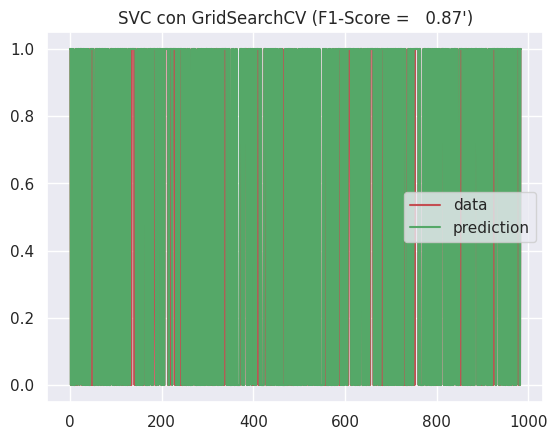

In [ ]:
f1 = f1_score(y_test_1h, y_pred, average='weighted')   
      
# x axis for plotting
import numpy as np
xx = np.stack(i for i in range(y_test_1h.shape[0]))
plt.plot(xx, y_test_1h, c='r', label='data')
plt.plot(xx, y_pred, c='g', label='prediction')
plt.axis('tight')
plt.legend()
plt.title("SVC con GridSearchCV (F1-Score = %6.2f')" % (f1))
plt.show()

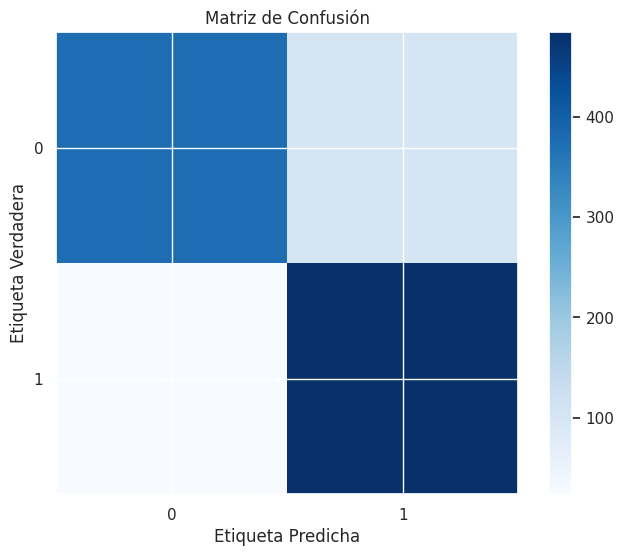

In [ ]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test_1h, y_pred)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Matriz de Confusión')
plt.colorbar()
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Verdadera')
plt.xticks([0, 1])
plt.yticks([0, 1])
plt.show()

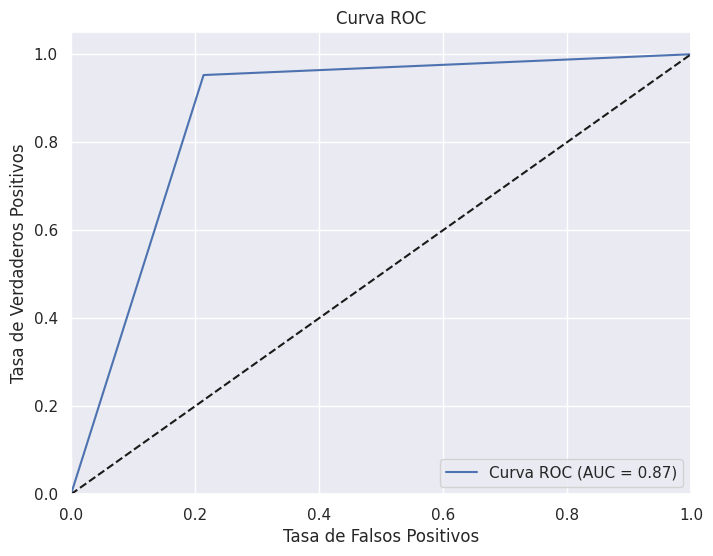

In [ ]:
# Calcular la curva ROC y el área bajo la curva (AUC)
fpr, tpr, thresholds = roc_curve(y_test_1h, y_pred)
roc_auc = auc(fpr, tpr)

# Visualizar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='Curva ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

 * #### ***Exportación del modelo***

In [ ]:
!pip install joblib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
joblib.dump(best_model,'Ozone_Forest_Model.pkl')
files.download('Ozone_Forest_Model.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## ***Valoraciones del entrenamiento y testeo***



Por lo que podemos valorar, ambos modelos han dado unos resultados considerablemente buenos:

*   Modelo RNN: Media del 93% de precisión para ambas clases
*   Modelo RandomForestClassifier: Media del 88% de precisión para ambas clases

Aunque debemos valorar que para ambos modelos la precisión para la clase 1 haya sido menor, los resultados han sido satisfactorios considerando que partimos desde una cantidad de muestras muy dispar y que hemos tenido que realizar técnicas de oversampling para compensarlo.

Tal y como hemos podido comprobar, parece que nuestro modelo de Redes ha resultado victorioso en esta comparativa al obtener mejores resultados para ambas clases.

Ahora que tenemos los modelos entrenados e importados, podemos proceder con llevar los modelos de predicción a un servicio web para su uso.

# ***Puesta en Servicio de los Modelos***

# ***Bibliografías & Web-Referencias***

*   ***Fuente de Datos:*** 

  https://archive.ics.uci.edu/ml/datasets/ozone+level+detection
  
*   ***¿Qué es el valor TT(Total-Totals)?:*** 

  https://www.theweatherprediction.com/habyhints/302/

*   ***¿Qué es el valor K-Index?:*** 
    
  https://es.wikipedia.org/wiki/%C3%8Dndice_geomagn%C3%A9tico_K

*   ***Valores de K-Index:*** 

  https://www.ign.es/web/gmt-indice-k

*   ***Para solventar los problemas*** 

  https://stackoverflow.com

*   ***Comparativa de técnicas de balanceo de datos - Pág 26*** 

  https://digibuo.uniovi.es/dspace/bitstream/handle/10651/60629/TFM_Joaqu%C3%ADnGarc%C3%ADaAbad.pdf?sequence=4

